# Introduction

In this notebook, we will develop a Multi-Task Convolutional Neural Network (CNN) to tackle two distinct classification tasks:

- The first task involves classifying images into one of 40 different classes
- The second task is a binary classification problem that determines whether there is more than one person in that image or not

In [1]:
# import Preperation libraries
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from collections import Counter
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
from scipy.stats import chi2_contingency
import random

# import Models libraries
import tensorflow as tf
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TerminateOnNaN, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.utils import plot_model

# import Evaluation libararies
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve

# Data loading, exploration and preparation

In [2]:
# ============
# Data loading
# ============

# Reading and writing files:
path = '../data/train_data_2024.csv'
data = pd.read_csv(path)
data.head()

,FileName,Class,MoreThanOnePerson,HighLevelCategory
0,Img_460.jpg,blowing_bubbles,YES,Social_LeisureActivities
1,Img_8152.jpg,blowing_bubbles,YES,Social_LeisureActivities
2,Img_9056.jpg,jumping,YES,Sports_Recreation
3,Img_3880.jpg,pushing_a_cart,YES,OutdoorActivities
4,Img_3168.jpg,writing_on_a_book,NO,Artistic_MusicalActivities


In [3]:
future_data = pd.read_csv('../data/future_data_2024.csv')
future_data.head()

,FileName
0,Img_1963.jpg
1,Img_7244.jpg
2,Img_6218.jpg
3,Img_7703.jpg
4,Img_6318.jpg


In [4]:
len(data), len(future_data)

(4500, 3128)

In [5]:
# ==========================
# MAIN PARAMETERS OF PROJECT (IDEALLY THIS SHOULD BE READ FROM A CONFIGURATION FILE)
# ==========================

wd = os.path.abspath('../')

########################
# DIR TO DATASETS
#########################

total_images    = wd + '/data/Images/'
training_data   = wd + '/data/train_data_2024.csv'
prediction_data = wd + '/data/final_predictions.csv'

#########################
# BALANCING TRAINING DATA
#########################

# DOWNSAMPLING CLASSES TOWARDS THE LOWEST NUMBER CLASS
balancing = False # SET TO FALSE TO SKIP

#############
# CONSTANTS
#############

num_classes = len(data['Class'].value_counts())
person_column=['MoreThanOnePerson_le']
float_type = 'float64'

#######################
# TRAINING PARAMETERS
#######################

img_height, img_width = 224, 224
batch_size = 32 

train_ratio = 0.90
valid_ratio = 0.08
test_ratio = 0.02

EPOCHS = 50

####################
# MODEL/RESULTS PATH
####################

model_path = wd + '/models/'
if not os.path.exists(model_path):
    os.makedirs(model_path)

results_path = wd + "/results/"
if not os.path.exists(results_path):
    os.makedirs(results_path)

In [6]:
# This is what our project's structure looks like
!tree -L 2 {wd}/

/home/ahmedsalim/projects/Multi-Task-Human-Action-Recognition/
├── README.md
├── conda_list.txt
├── configs
│   └── config.yaml
├── data
│   ├── Images
│   ├── final_predictions.csv
│   ├── future_data_2024.csv
│   └── train_data_2024.csv
├── models
├── notebook
│   └── notebook.ipynb
├── results
└── src
    └── Modules.py

7 directories, 8 files


The first next step would be to encode the categorical features, such as Class, MoreThanOnePerson, and HighLevelCategory. We use LabelEncoder to convert these categorical values into numeric format, which is essential for the model training

In [7]:
# ================================
# ENCODING OF CATEGORICAL FEATURES
# ================================

# a. Label encoding of HighLevelCategory and Class

categorical_target = ['Class', 'MoreThanOnePerson', 'HighLevelCategory']
categorical_target_encoders = []

le_dic = {}
for item in categorical_target:
    le = LabelEncoder()
    le.fit(data[item])
    data[item+'_le'] = le.transform(data[item])
    print(item, le.classes_, le.transform(le.classes_) ) #le.classes_ gives the unique values
    print()
    categorical_target_encoders.append(le)
    le_dic[item] = le

data.head()

Class ['applauding' 'blowing_bubbles' 'brushing_teeth' 'cleaning_the_floor'
 'climbing' 'cooking' 'cutting_trees' 'cutting_vegetables' 'drinking'
 'feeding_a_horse' 'fishing' 'fixing_a_bike' 'fixing_a_car' 'gardening'
 'holding_an_umbrella' 'jumping' 'looking_through_a_microscope'
 'looking_through_a_telescope' 'phoning' 'playing_guitar' 'playing_violin'
 'pouring_liquid' 'pushing_a_cart' 'reading' 'riding_a_bike'
 'riding_a_horse' 'rowing_a_boat' 'running' 'shooting_an_arrow' 'smoking'
 'taking_photos' 'texting_message' 'throwing_frisby' 'using_a_computer'
 'walking_the_dog' 'washing_dishes' 'watching_TV' 'waving_hands'
 'writing_on_a_board' 'writing_on_a_book'] [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]

MoreThanOnePerson ['NO' 'YES'] [0 1]

HighLevelCategory ['AnimalCare' 'Artistic_MusicalActivities' 'Communication_Technology'
 'HouseholdActivities' 'MaintenanceRepair' 'Observation_Exploration'
 'Outdoor

,FileName,Class,MoreThanOnePerson,HighLevelCategory,Class_le,MoreThanOnePerson_le,HighLevelCategory_le
0,Img_460.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8
1,Img_8152.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8
2,Img_9056.jpg,jumping,YES,Sports_Recreation,15,1,9
3,Img_3880.jpg,pushing_a_cart,YES,OutdoorActivities,22,1,6
4,Img_3168.jpg,writing_on_a_book,NO,Artistic_MusicalActivities,39,0,1


Since Class is our target, we converted it into a one-hot encoded format

In [8]:
#b. Categorical encoding of Class

dd = to_categorical(data['Class_le'],num_classes=num_classes).astype(int)
le = le_dic['Class']
columns_class = le.inverse_transform(list(range(num_classes))).tolist()
columns_class = [x.lower() for x in columns_class]
dd_pd = pd.DataFrame(dd,columns=columns_class)

data = pd.concat([data,dd_pd], axis=1)
data.head(10)

,FileName,Class,MoreThanOnePerson,HighLevelCategory,Class_le,MoreThanOnePerson_le,HighLevelCategory_le,applauding,blowing_bubbles,brushing_teeth,...,taking_photos,texting_message,throwing_frisby,using_a_computer,walking_the_dog,washing_dishes,watching_tv,waving_hands,writing_on_a_board,writing_on_a_book
0,Img_460.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,Img_8152.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,Img_9056.jpg,jumping,YES,Sports_Recreation,15,1,9,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Img_3880.jpg,pushing_a_cart,YES,OutdoorActivities,22,1,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Img_3168.jpg,writing_on_a_book,NO,Artistic_MusicalActivities,39,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,Img_8609.jpg,writing_on_a_book,NO,Artistic_MusicalActivities,39,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
6,Img_3838.jpg,walking_the_dog,NO,OutdoorActivities,34,0,6,0,0,0,...,0,0,0,0,1,0,0,0,0,0
7,Img_1699.jpg,feeding_a_horse,NO,AnimalCare,9,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,Img_8543.jpg,pushing_a_cart,YES,OutdoorActivities,22,1,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,Img_1980.jpg,smoking,YES,Social_LeisureActivities,29,1,8,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
columns_class

['applauding',
 'blowing_bubbles',
 'brushing_teeth',
 'cleaning_the_floor',
 'climbing',
 'cooking',
 'cutting_trees',
 'cutting_vegetables',
 'drinking',
 'feeding_a_horse',
 'fishing',
 'fixing_a_bike',
 'fixing_a_car',
 'gardening',
 'holding_an_umbrella',
 'jumping',
 'looking_through_a_microscope',
 'looking_through_a_telescope',
 'phoning',
 'playing_guitar',
 'playing_violin',
 'pouring_liquid',
 'pushing_a_cart',
 'reading',
 'riding_a_bike',
 'riding_a_horse',
 'rowing_a_boat',
 'running',
 'shooting_an_arrow',
 'smoking',
 'taking_photos',
 'texting_message',
 'throwing_frisby',
 'using_a_computer',
 'walking_the_dog',
 'washing_dishes',
 'watching_tv',
 'waving_hands',
 'writing_on_a_board',
 'writing_on_a_book']

## Exploratory Data Analysis (EDA)

In [10]:
# ===============================
# Basic Exploratory Data Analysis
# ===============================

class EDA:

    @staticmethod
    def plot_distribution(pd_series):
        labels = pd_series.value_counts().index.tolist()
        counts = pd_series.value_counts().values.tolist()

        pie_plot = go.Pie(labels=labels, values=counts, hole=.3)
        fig = go.Figure(data=[pie_plot])
        fig.update_layout(title_text='Distribution for %s' % pd_series.name)

        fig.show()

    @staticmethod
    def plot_class_distribution(df):
        fig = px.histogram(df, x="Class", nbins=20)
        fig.update_layout(title_text='Class distribution')
        fig.show()

    @staticmethod
    def plot_targets(df):
        classes = df['Class'].value_counts()
        persons = df['MoreThanOnePerson'].value_counts()

        fig, axs = plt.subplots(1, 2, figsize=(17, 8), sharey=False)
        fig.suptitle('Target Categorical Plotting', weight='bold', fontsize=16)

        bars1 = axs[0].barh(classes.index, classes.values, color='#0C457D')
        axs[0].set_xlabel('', weight='bold', fontsize=12)
        axs[0].tick_params(axis='x', labelsize=10)
        axs[0].tick_params(axis='y', labelsize=10,)

        for bar in bars1:
            w = bar.get_width()
            axs[0].text(w, bar.get_y() + bar.get_height() / 2, str(int(w)), ha='left', va='center', fontsize=12)

        bars2 = axs[1].barh(persons.index, persons.values, color='#0C457D')
        axs[1].set_ylabel('')
        axs[1].tick_params(axis='x', labelsize=10)
        axs[1].tick_params(axis='y', labelsize=10)

        for bar in bars2:
            w = bar.get_width()
            axs[1].text(w, bar.get_y() + bar.get_height() / 2, str(int(w)), ha='left', va='center', fontsize=12)

        plt.tight_layout()
        plt.show()
        
        
    @staticmethod
    def plot_highlevelcategory_relationship(df):
        # Plot relationship between HighLevelCategory and Class
        fig = px.histogram(df, x='Class', color='HighLevelCategory', 
                           category_orders={'HighLevelCategory': sorted(df['HighLevelCategory'].unique())},
                           title='Distribution of Class by HighLevelCategory')
        fig.update_layout(barmode='stack')
        fig.show()

        # Plot relationship between HighLevelCategory and MoreThanOnePerson
        fig = px.histogram(df, x='MoreThanOnePerson', color='HighLevelCategory', 
                           category_orders={'HighLevelCategory': sorted(df['HighLevelCategory'].unique())},
                           title='Distribution of MoreThanOnePerson by HighLevelCategory')
        fig.update_layout(barmode='stack')
        fig.show()
        
    @staticmethod
    def plot_contingency_heatmaps(df):
        cross_tab_class_highlevel = pd.crosstab(df['Class'], df['HighLevelCategory'])
        cross_tab_morethanone_highlevel = pd.crosstab(df['MoreThanOnePerson'], df['HighLevelCategory'])
        
        chi2_class, p_class, _, _ = chi2_contingency(cross_tab_class_highlevel)
        chi2_morethanone, p_morethanone, _, _ = chi2_contingency(cross_tab_morethanone_highlevel)

        fig, axs = plt.subplots(1, 2, figsize=(18, 12), sharey=False)
        fig.suptitle('Contingency Tables Heatmap', weight='bold', fontsize=16)

        sns.heatmap(cross_tab_class_highlevel, annot=True, fmt='d', cmap='Blues', ax=axs[0], cbar=False, linewidths=0.5, linecolor='#0C457D')
        axs[0].set_title(f'Class vs HighLevelCategory\nChi2: {chi2_class:.2f}, p-value: {p_class:.4f}')
        axs[0].tick_params(axis='x', labelsize=10)
        axs[0].tick_params(axis='y', labelsize=10)

        sns.heatmap(cross_tab_morethanone_highlevel, annot=True, fmt='d', cmap='Oranges', ax=axs[1], cbar=False, linewidths=0.5, linecolor='#0C457D')
        axs[1].set_title(f'MoreThanOnePerson vs HighLevelCategory\nChi2: {chi2_morethanone:.2f}, p-value: {p_morethanone:.4f}')
        axs[1].tick_params(axis='x', labelsize=10)
        axs[1].tick_params(axis='y', labelsize=10)

        # Adjust layout
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

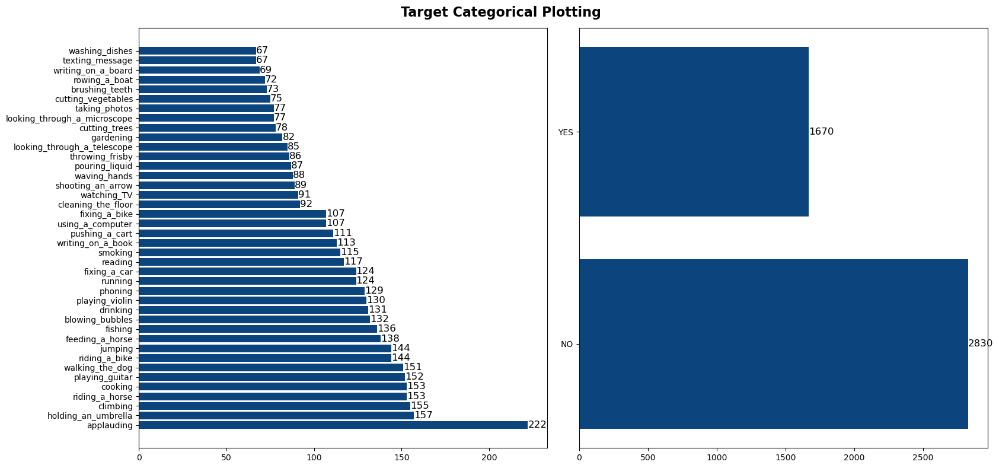

In [11]:
# Let's plot the distributions of:
# - Class variables.
# - More than one person distribution.

EDA.plot_targets(data)

In [12]:
EDA.plot_distribution(data['Class'])

In [13]:
EDA.plot_distribution(data['HighLevelCategory'])

In [14]:
EDA.plot_class_distribution(data)

In [15]:
EDA.plot_highlevelcategory_relationship(data)

To better understand the relationships in the data, we will visualize the results of the Chi-squared test to evaluate if there is a significant association between the Class, MoreThanOnePerson, and HighLevelCategory columns

Examining this plot will help us determine whether to include the HighLevelCategory column as a feature in our model development

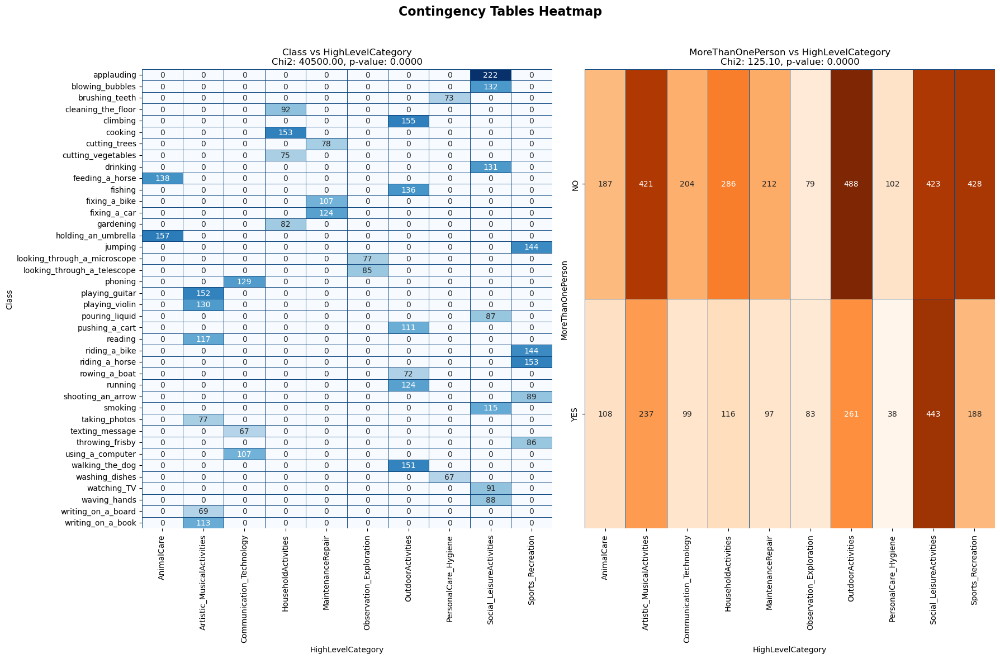

In [16]:
EDA.plot_contingency_heatmaps(data)

We can observe that the HighLevelCategory column is distributed unevenly. For instance, **Social_LeisureActivities** from the HighLevelCategory column appears most frequently in the **applauding** class, with a total of 222 occurrences. We can confirm this by running the following code:

In [17]:
social_applauding = data[(data['HighLevelCategory'] == 'Social_LeisureActivities') & (data['Class'] == 'applauding')]
print(f"Number of occurrences: {social_applauding.shape[0]}")

Number of occurrences: 222


We will skip the HighLevelCategory column and focus on the images as features for now.

Let's take a look at some images from our dataset, along with their associated classes and the number of people in each image

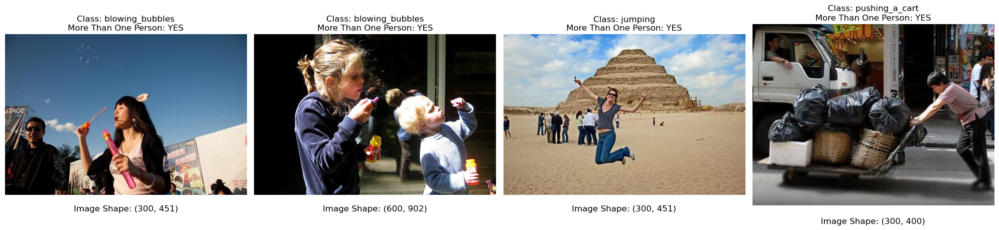

In [18]:
# =============================================================
# Plotting a set number of images, including:
#  - their class labels
#  - whether they contain more than one person
# =============================================================

num_imgs = 4 # number of images to display

fig, ax = plt.subplots(ncols=num_imgs, figsize=(20, 5))
for idx, (i, row) in enumerate(data.head(num_imgs).iterrows()):
    img_path = os.path.join(total_images, row['FileName'])
    class_name = row['Class']
    more_than_one_person = row['MoreThanOnePerson']

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax[idx].imshow(img_rgb)
    ax[idx].set_title(f"Class: {class_name}\nMore Than One Person: {more_than_one_person}")
    ax[idx].axis('off')
    ax[idx].text(0.5, -0.1, f"Image Shape: {img_rgb.shape[:2]}", size=12, ha='center', transform=ax[idx].transAxes)

plt.tight_layout()
plt.show()


# Data Preprocessing

From the previous analysis, it's clear that the data has an imbalanced distribution across its classes. For example, the "applauding" class has the most samples with a total of 222, while the "washing dishes" class has only 67. We’ve also observed that the images vary in shape

## Addressing Imbalance Distribution

This imbalance can significantly affect our model’s performance if not addressed. We can tackle this issue in several ways, such as downsampling the majority classes to match the number of samples in the minority class, or oversampling the minority classes by duplicating existing images. Another approach is data augmentation, which involves creating new images with varied parameters. Tools like <a href="https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator" target="_blank">TensorFlow</a> and <a href="https://albumentations.ai/docs/" target="_blank">Albumentations</a> offer various data augmentation techniques

We have included a simple function to downsample the largest classes towards the smallest one.. However, we didn't use it, as it would result in a loss of data and reduce the total number of images available.

In [19]:
# ============================================================================
# Balancing the dataset to have same number of classes
# This will reduce the number of images, which might affect model performance
# Consider skipping this step as we'll apply augmentation within the generators instead
# ============================================================================

def downsample(df, label_col_name, random_state=42):
    '''
    This function allows to balcance the different classes of a feature label_col_name by
    downsampling the largest classes towards the smallest one. During the process,
    the dataframe rows are shuffled.
    '''
    # find the number of observations in the smallest group
    nmin = df[label_col_name].value_counts().min()
    df_balanced = (df
            # split the dataframe per group
            .groupby(label_col_name)
            # sample nmin observations from each group
            .apply(lambda x: x.sample(nmin))
            # recombine the dataframes
            )
    df_out = df_balanced.sample(len(df_balanced), random_state=random_state).reset_index(drop=True)
    return df_out



if balancing: # downsampling toward the lowest class
    data_balanced = downsample(data, 'Class', random_state=42)
else:
    data_balanced = data.copy() # no downsampling

print(f'Size of balanced dataframe: {len(data_balanced)}')
print(data_balanced['Class'].value_counts())
data_balanced.head()

Size of balanced dataframe: 4500
Class
applauding                      222
holding_an_umbrella             157
climbing                        155
riding_a_horse                  153
cooking                         153
playing_guitar                  152
walking_the_dog                 151
riding_a_bike                   144
jumping                         144
feeding_a_horse                 138
fishing                         136
blowing_bubbles                 132
drinking                        131
playing_violin                  130
phoning                         129
running                         124
fixing_a_car                    124
reading                         117
smoking                         115
writing_on_a_book               113
pushing_a_cart                  111
using_a_computer                107
fixing_a_bike                   107
cleaning_the_floor               92
watching_TV                      91
shooting_an_arrow                89
waving_hands             

,FileName,Class,MoreThanOnePerson,HighLevelCategory,Class_le,MoreThanOnePerson_le,HighLevelCategory_le,applauding,blowing_bubbles,brushing_teeth,...,taking_photos,texting_message,throwing_frisby,using_a_computer,walking_the_dog,washing_dishes,watching_tv,waving_hands,writing_on_a_board,writing_on_a_book
0,Img_460.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,Img_8152.jpg,blowing_bubbles,YES,Social_LeisureActivities,1,1,8,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,Img_9056.jpg,jumping,YES,Sports_Recreation,15,1,9,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Img_3880.jpg,pushing_a_cart,YES,OutdoorActivities,22,1,6,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Img_3168.jpg,writing_on_a_book,NO,Artistic_MusicalActivities,39,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


We will use <a href="https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator" target="_blank">ImageDataGenerator</a> from TensorFlow to address the imbalance problem.

Below is a simple example demonstrating how it works with a test image.

In [20]:
imgs = []
for root, dirs, files in os.walk(total_images):
    for file in files:
        imgs.append(os.path.join(root, file))

img_path = random.choice(imgs)

img = Image.open(img_path)
img_arr = np.expand_dims(np.array(img), axis=0)

In [21]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True, 
    fill_mode='reflect' # explore other fill modes, such like 'nearest', 'constant', 'wrap'
)


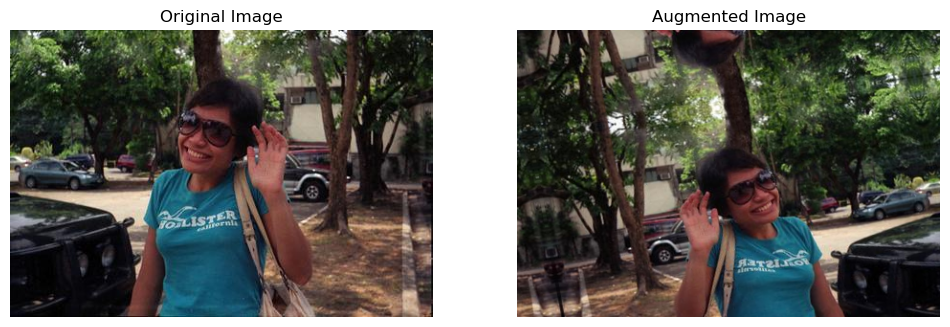

In [22]:
batch = next(
    datagen.flow(img_arr, batch_size=1)
)

aug_img = batch[0].astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(img_arr[0].astype(np.uint8))
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(aug_img)
axes[1].set_title("Augmented Image")
axes[1].axis('off')

plt.show()

In [23]:
# =============================================================
# OPTIONAL:
# Save images from the csv to a specified directory.
# The main idea is to create two new folders,
#  to handle the images that will be trained, and predected
# =============================================================

Save = False   # set to True to save images

train_images  = os.path.join(wd, 'data/train_images')
future_images = os.path.join(wd, 'data/future_images')

def save_images_from_csv(df, src_images, save_dir, tagret_shape=(img_height, img_width)):
    os.makedirs(save_dir, exist_ok=True)
    print(f'Total number of images needed: {len(df)}')

    i = 0
    for _, row in tqdm(df.iterrows(), total=len(df), desc="Saving images", unit="image"):
        img_path = os.path.join(src_images, row['FileName'])

        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Image {img_path} could not be read. Skipping...")
            continue
        img_out = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # img_out = cv2.resize(img_out, tagret_shape)  # no need for resizing as the generator will do that for us

        save_path = os.path.join(save_dir, row['FileName'])
        success = cv2.imwrite(save_path, cv2.cvtColor(img_out, cv2.COLOR_RGB2BGR))
        if success:
            i += 1
        else:
            print(f"Error: could not save image {save_path}")
    print(f"Total images saved: {i}\nImages are available in: {save_dir}")


if Save:
    print('Resizing training Images..')
    save_images_from_csv(data_balanced, total_images, save_dir=train_images, tagret_shape=(img_height, img_width))
    print('\nResizing future Images..')
    save_images_from_csv(future_data, total_images, save_dir=future_images, tagret_shape=(img_height, img_width))


In [24]:
image_counter = 0
shape_counter = Counter()

for filename in os.listdir(total_images):
    image_path = os.path.join(total_images, filename)
    img = cv2.imread(image_path)
    shape = img.shape[:2]  # only consider img_height and width (ignore channels)

    shape_counter[shape] += 1
    image_counter += 1

print(f"Total unique shapes: {len(shape_counter)}\nTotal number of images: {image_counter}")

print("\nTop 5 most common shapes:")
for shape, count in shape_counter.most_common(5):
    print(f"Shape: {shape}, Count: {count}")

Total unique shapes: 1595
Total number of images: 9532

Top 5 most common shapes:
Shape: (300, 400), Count: 1166
Shape: (300, 451), Count: 684
Shape: (400, 300), Count: 565
Shape: (451, 300), Count: 481
Shape: (400, 534), Count: 253


The difference in image shapes can be ignored, as the ImageDataGenerator will handle resizing based on the `img_height` and `img_width` defined earlier


## Create Generators

We will create four different generators using ImageDataGenerator and **flow_from_dataframe** to handle our data, since our dataset in CSV files includes a `FileName` column with image names. The four generators will be:

1. **Training Generator**: This will be used to train our model. It will include data augmentation to address the class imbalance, and we will rescale the images to a range of 0 to 1. This normalization helps with model training and stability. We will also use float32 as the data type, which is important for a multi-task model

2. **Validation Generator**: This will be used to validate the model during the training process

3. **Heldout Generator**: This will be used to test the model after training is complete. It will not be included during the training phase

4. **Prediction Generator**: This will be used for future predictions. It ensures that the input data to the model is consistent with how the model was trained

In [25]:
# ==================
# ImageDataGenerator
# ==================

# Training data will be augmented
training_datagen=ImageDataGenerator(
    rescale=1./255.,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='reflect',
    dtype = float_type
)


# Validation, test and predected data should not be augmented
test_datagen=ImageDataGenerator(
    rescale=1./255.,
    dtype = float_type
)

The <a href="https://github.com/keras-team/keras/tree/v3.3.3/keras/src/legacy/preprocessing/image.py#L1120-L1157" target="_blank"> flow_from_dataframe</a> method includes many arguments. We will use it to handle our CSV files, with `x_col` specifying the image file names and `y_col` for our target columns, which are Class and MoreThanOnePerson

We will split the dataset to be 90% for training, 8% for validation, and 2% for heldout testing

In [26]:
# First lets define some constants:

# These our targets columns, Class, and MoreThanOnePerson
columns = columns_class + person_column
#             ~40              ~1

# split ratios
total_samples = len(data_balanced)
train_end = int(total_samples * train_ratio)
valid_end = train_end + int(total_samples * valid_ratio)

# dataset we will use later for predections
pred_data = pd.read_csv(prediction_data)

In [27]:
train_generator = training_datagen.flow_from_dataframe(
    dataframe=data_balanced[:train_end],
    directory=total_images,
    x_col="FileName",
    y_col=columns,
    batch_size=batch_size,
    seed=42,
    shuffle=True,             # shsould be shuffled
    class_mode="raw",
    target_size=(img_height,img_width)
)


# here: not using augmentation in validation set
valid_generator=test_datagen.flow_from_dataframe(
    dataframe=data_balanced[train_end:valid_end],
    directory=total_images,
    x_col="FileName",
    y_col=columns,
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode="raw",
    target_size=(img_height,img_width)
)

heldout_generator=test_datagen.flow_from_dataframe(
    dataframe=data_balanced[valid_end:],
    directory=total_images,
    x_col="FileName",
    y_col=None,
    batch_size=1,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(img_height,img_width)
)


predection_generator=test_datagen.flow_from_dataframe(
    dataframe=pred_data,
    directory=total_images,
    x_col="FileName",
    y_col=None,
    batch_size=1,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(img_height,img_width)
)


# defining steps for the model

TRAINING_STEPS=train_generator.n//train_generator.batch_size
VALIDATION_STEPS=valid_generator.n//valid_generator.batch_size
HELDOUT_STEPS=heldout_generator.n//heldout_generator.batch_size
PREDICTION_STEPS=predection_generator.n//predection_generator.batch_size



def generator_wrapper(generator):
    for batch_x, batch_y in generator:
        class_targets = batch_y[:, :40]
        more_than_one_person_targets = batch_y[:, 40].reshape(-1, 1) # last column is binary label

        yield batch_x, (class_targets, more_than_one_person_targets)

Found 4050 validated image filenames.
Found 360 validated image filenames.
Found 90 validated image filenames.
Found 3128 validated image filenames.


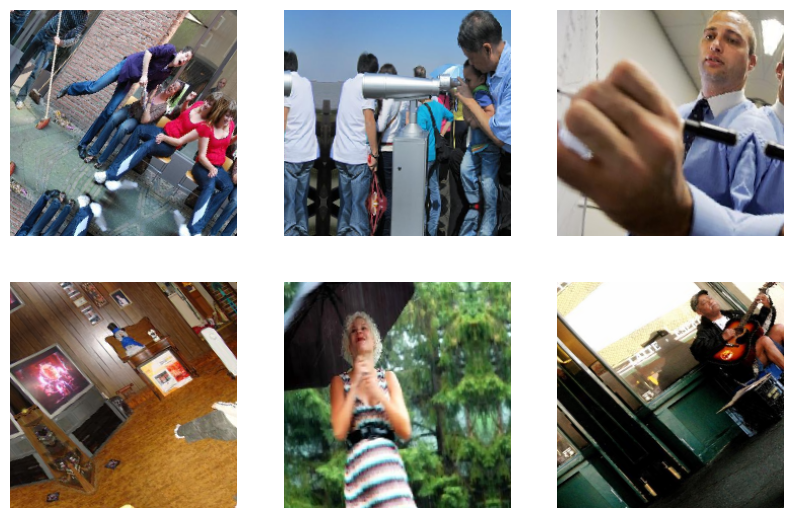

In [28]:
# Visualize some of the training generator (including augmentations)
x_batch, y_batch = next(train_generator)

plt.figure(figsize=(10, 10))
for i in range(6):
    plt.subplot(3, 3, i+1)
    plt.imshow(x_batch[i])
    plt.axis('off')
plt.show()

In [29]:
x_batch[i]

array([[[8.55270743e-01, 8.11593413e-01, 8.18822980e-01],
        [9.59745407e-01, 9.27907765e-01, 9.43603873e-01],
        [9.84704018e-01, 9.58443582e-01, 9.64460909e-01],
        ...,
        [8.84328783e-01, 8.84830296e-01, 8.37125361e-01],
        [9.14125144e-01, 9.04928029e-01, 8.26571584e-01],
        [9.44703341e-01, 9.31474388e-01, 8.33165050e-01]],

       [[9.50063527e-01, 9.34310853e-01, 9.40215826e-01],
        [9.97626662e-01, 9.84493434e-01, 9.91449535e-01],
        [1.00000000e+00, 9.85425234e-01, 9.69978929e-01],
        ...,
        [8.99062753e-01, 8.83059442e-01, 8.49178195e-01],
        [9.17244792e-01, 8.87785375e-01, 8.53769958e-01],
        [9.35372055e-01, 9.00801778e-01, 8.29304934e-01]],

       [[9.67697501e-01, 9.52130795e-01, 9.51010883e-01],
        [9.78119016e-01, 9.66703534e-01, 9.58373010e-01],
        [9.99155998e-01, 9.92708623e-01, 9.66389775e-01],
        ...,
        [9.25939858e-01, 8.94502521e-01, 8.46534729e-01],
        [9.24076736e-01, 8.88

The generators have handled the scaling for us, so now our arrays are normalized to a range between 0 and 1.

Now let's build our model.

# Multi-task Modelling

The models are in a 2-task model:

 - The task 1 is a multi-class classification of the `Class` column. The output for this task is a dense(40) layer, to be matched with a one-hot-encoded version of the class column (containing 40 classes). As it is a multi-class problem, the loss function for that task is a softmax, i.e., the probabilities of all classes sum to 1.

 - The task 2 is a label classification of the `MoreThanOnePerson` column. The output for this task is a dense(1) layer, to be matched with the column (already in one-hot-encoded format). As it is a multi-label problem, the loss function for that task is a sigmoid, i.e., the probabilities for each label is independent from the other labels.

In [30]:
# Avoid OOM errors by looping through all of potential gpus, and keep it to a minimum needs
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## Model Structure

For our model architecture, we’re using the VGG16 pre-trained CNN as a base. This helps us leverage its learned features and adapt them to our tasks. Here’s the setup:

- **Input Layer**: Takes images of size 254x254 with 3 color channels (RGB).
- **Base Model**: VGG16 for feature extraction, with all layers frozen except the last four.
- **Global Average** Pooling Layer: Reduces spatial dimensions.
- **Dense Layer**: 256 units with ReLU activation
- **Output Layers**:
    1. **output 1**: For classifying into 40 categories using a softmax activation.
    2. **output 2**: For binary classification to check if there's more than one person in the image, using a sigmoid activation.

<br>
To sum up, we loaded VGG16 without its top layers to focus on feature extraction. We froze the initial layers to keep the pre-trained knowledge and only retrained the latter layers to fit our new classification tasks. We added new layers on top, including a global average pooling layer and a dense layer with 256 ReLU units for better representation. Finally, we have two dense layers: one with 40 units and softmax for class probabilities, and another with 1 unit and sigmoid for determining if there's more than one person in the image.


In [31]:
# ================================
# Model definition and preparation
# ================================

# Task 1: classification of one class of classes among 40; a typical multi-class task
# Task 2: detection of 1 potential person; a typical label task

# ==================
# TRANSFER LEARNING
# ==================

def vgg16_model_building(height,width):

    input_img = Input(shape=(height, width, 3), name='input', dtype=tf.float32)
    base_model = VGG16(weights='imagenet', include_top=False, input_tensor=input_img)
    for layer in base_model.layers[:-4]:
        layer.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)

    output1 = Dense(40, activation='softmax', name='Class')(x)              # For multi-class classification
    output2 = Dense(1, activation='sigmoid', name='MoreThanOnePerson')(x)   # For binary classification

    model = Model(inputs=base_model.input, outputs=[output1, output2])

    return model


tf.keras.backend.clear_session()
tf.keras.backend.set_floatx(float_type)
tf.keras.mixed_precision.set_global_policy('mixed_float16')

model = vgg16_model_building(img_height, img_width)


- The model was compiled with the Adam optimizer and a learning rate of 0.0001.

- Loss functions are categorical crossentropy for Class and binary crossentropy for MoreThanOnePerson, both evaluated with accuracy.

- Callbacks include saving the best model, early stopping, logging, learning rate adjustment, and handling NaNs.

In [32]:
# =============
# Model Compile
# =============

# optimizers
opt = Adam(learning_rate=0.0001)

model.compile(
    optimizer=opt,
    loss={'Class': 'categorical_crossentropy',
            'MoreThanOnePerson': 'binary_crossentropy'
    },
    metrics={
        'Class': 'accuracy',
        'MoreThanOnePerson': 'accuracy'
    }
)

checkpoint_callback = ModelCheckpoint(
    filepath=os.path.join(
        model_path,
        'best_model.keras'
    ),
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
    verbose=1
)

callbacks = [
    EarlyStopping(monitor="val_loss", patience=30, verbose=0, mode='min'),
    CSVLogger(os.path.join(model_path, 'model_training.log'),
              separator=',',
              append=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001),
    TerminateOnNaN(),
    checkpoint_callback
]

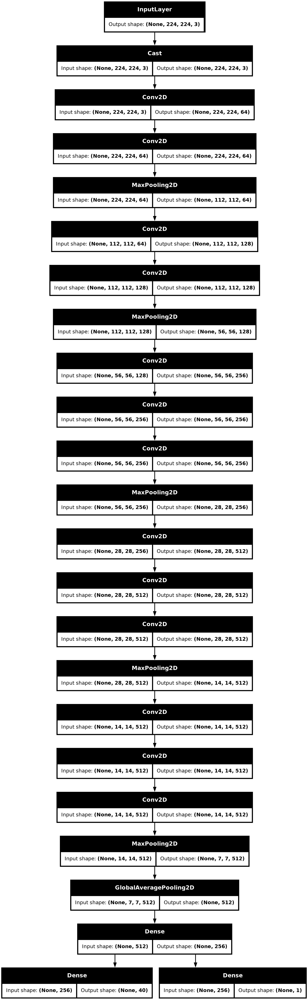

In [33]:
# ===============
# Model structure
# ===============
plot_model(model, to_file=os.path.join(model_path, 'model_plot.png'), show_shapes=True)

In [34]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 224, 224,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cast (Cast)         │ (None, 224, 224,  │          0 │ input[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 224, 224,  │      1,792 │ cast[0][0]        │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 224, 224,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 112, 112,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 112, 112,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 112, 112,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 56, 56,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 56, 56,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 56, 56,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 56, 56,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 28, 28,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 28, 28,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 28, 28,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 28, 28,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 14, 14,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 14, 14,    │  2,359,808 │ block4_pool[0][0

 Total params: 14,856,553 (56.67 MB)

 Trainable params: 7,221,289 (27.55 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

Before training, we need to check the model’s input and output shapes to ensure they match our generators and verify that the data fits correctly

In [35]:
input_shape = model.input_shape
print("Model Input Shape:", input_shape)
output_shape = model.output_shape
print("Model Output Shape:", output_shape)

Model Input Shape: (None, 224, 224, 3)
Model Output Shape: [(None, 40), (None, 1)]


In [36]:
# ===========================================
# CHECKING DATA THAT WILL BE FIT IN THE MODEL
# ===========================================

for batch_x, (class_targets, binary_target) in generator_wrapper(train_generator):

    # check shapes
    print(f"batch_x shape: {batch_x.shape}")  # (batch_size, height, width, channels)
    print(f"class_targets shape: {class_targets.shape}")  # (batch_size, 40)
    print(f"binary_target shape: {binary_target.shape}")  # (batch_size, 1)

    # check types
    print(f'Image data type: {type(batch_x)}')
    print(f'class_targets data type: {type(class_targets)}')
    print(f'binary_target data type: {type(binary_target)}')

    # check sample
    print(f'Image sample: {type(batch_x[0])}')
    print(f'class_targets sample: {type(class_targets[0])}')
    print(f'binary_target sample: {type(binary_target[0])}')

    break

batch_x shape: (32, 224, 224, 3)
class_targets shape: (32, 40)
binary_target shape: (32, 1)
Image data type: <class 'numpy.ndarray'>
class_targets data type: <class 'numpy.ndarray'>
binary_target data type: <class 'numpy.ndarray'>
Image sample: <class 'numpy.ndarray'>
class_targets sample: <class 'numpy.ndarray'>
binary_target sample: <class 'numpy.ndarray'>


## Model Training

The data is correct because the model’s input shape (None, 224, 224, 3) matches the batch data shape (32, 224, 224, 3). The output shapes [(None, 40), (None, 1)] align with the class targets (32, 40) and binary targets (32, 1). All data types are numpy.ndarray, which is consistent with the model’s expectations.

For training, the batch size is 32, which matches the shape of our batche shapes above. This means the model processes 32 samples at a time before updating its weights. 

The training, validation, heldout, and prediction steps are set by dividing the number of samples in each generator by the batch size.

In [37]:
# =============
# MAIN TRAINING
# =============

history = model.fit(generator_wrapper(train_generator),
                    steps_per_epoch=TRAINING_STEPS,
                    validation_data=generator_wrapper(valid_generator),
                    validation_steps=VALIDATION_STEPS,
                    epochs=EPOCHS,
                    callbacks=callbacks)

Epoch 1/50


I0000 00:00:1724856554.165805  333438 service.cc:146] XLA service 0x7fd9c00063c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1724856554.165892  333438 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-08-28 22:49:14.218196: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-08-28 22:49:14.673547: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
I0000 00:00:1724856561.735086  333438 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step - Class_accuracy: 0.0709 - Class_loss: 3.5893 - MoreThanOnePerson_accuracy: 0.6628 - MoreThanOnePerson_loss: 0.6291 - loss: 4.2184
Epoch 1: val_loss improved from inf to 3.65546, saving model to /home/ahmedsalim/projects/Multi-Task-Human-Action-Recognition/models/best_model.keras
126/126 ━━━━━━━━━━━━━━━━━━━━ 58s 382ms/step - Class_accuracy: 0.0712 - Class_loss: 3.5881 - MoreThanOnePerson_accuracy: 0.6629 - MoreThanOnePerson_loss: 0.6290 - loss: 4.2171 - val_Class_accuracy: 0.1989 - val_Class_loss: 3.0276 - val_MoreThanOnePerson_accuracy: 0.6250 - val_MoreThanOnePerson_loss: 0.6279 - val_loss: 3.6555 - learning_rate: 1.0000e-04
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - Class_accuracy: 0.1947 - Class_loss: 2.9770 - MoreThanOnePerson_accuracy: 0.6805 - MoreThanOnePerson_loss: 0.6003 - loss: 3.5773

2024-08-28 22:50:47.152813: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_275', 8 bytes spill stores, 8 bytes spill loads

2024-08-28 22:50:47.239480: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_275', 8 bytes spill stores, 8 bytes spill loads




Epoch 2: val_loss improved from 3.65546 to 3.11296, saving model to /home/ahmedsalim/projects/Multi-Task-Human-Action-Recognition/models/best_model.keras
126/126 ━━━━━━━━━━━━━━━━━━━━ 42s 337ms/step - Class_accuracy: 0.1949 - Class_loss: 2.9764 - MoreThanOnePerson_accuracy: 0.6806 - MoreThanOnePerson_loss: 0.6002 - loss: 3.5766 - val_Class_accuracy: 0.2683 - val_Class_loss: 2.6009 - val_MoreThanOnePerson_accuracy: 0.7317 - val_MoreThanOnePerson_loss: 0.5508 - val_loss: 3.1130 - learning_rate: 1.0000e-04
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - Class_accuracy: 0.2930 - Class_loss: 2.5855 - MoreThanOnePerson_accuracy: 0.7281 - MoreThanOnePerson_loss: 0.5484 - loss: 3.1339
Epoch 3: val_loss improved from 3.11296 to 2.84118, saving model to /home/ahmedsalim/projects/Multi-Task-Human-Action-Recognition/models/best_model.keras
126/126 ━━━━━━━━━━━━━━━━━━━━ 38s 302ms/step - Class_accuracy: 0.2931 - Class_loss: 2.5852 - MoreThanOnePerson_accuracy: 0.7279 - MoreThanOnePerson_loss:

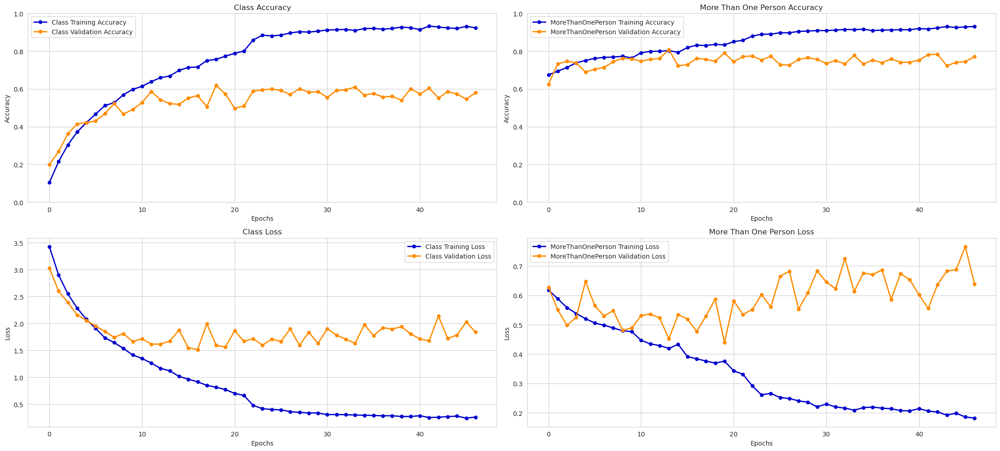

In [38]:
# ========================
# Plot of training history
# ========================

def training_performance(his):

    sns.set_style("whitegrid")
    sns.set_palette("YlGnBu")
    fig, axes = plt.subplots(2, 2, figsize=(22, 10))

    # class train, valid accuracy
    axes[0, 0].plot(his.history["Class_accuracy"], label="Class Training Accuracy", linewidth=2, linestyle='-', marker='o', markersize=5, color='mediumblue')
    axes[0, 0].plot(his.history["val_Class_accuracy"], label="Class Validation Accuracy", linewidth=2, linestyle='-', marker='o', markersize=5, color='darkorange')
    axes[0, 0].set_title("Class Accuracy")
    axes[0, 0].set_xlabel("Epochs")
    axes[0, 0].set_ylabel("Accuracy")
    axes[0, 0].set_ylim([0, 1])
    axes[0, 0].legend(loc='best')

    # more than one person train, valid accuracy
    axes[0, 1].plot(his.history["MoreThanOnePerson_accuracy"], label="MoreThanOnePerson Training Accuracy", linewidth=2, linestyle='-', marker='o', markersize=5, color='mediumblue')
    axes[0, 1].plot(his.history["val_MoreThanOnePerson_accuracy"], label="MoreThanOnePerson Validation Accuracy", linewidth=2, linestyle='-', marker='o', markersize=5, color='darkorange')
    axes[0, 1].set_title("More Than One Person Accuracy")
    axes[0, 1].set_xlabel("Epochs")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].set_ylim([0, 1])
    axes[0, 1].legend(loc='best')

    # class train, valid loss
    axes[1, 0].plot(his.history["Class_loss"], label="Class Training Loss", linewidth=2, linestyle='-', marker='o', markersize=5, color='mediumblue')
    axes[1, 0].plot(his.history["val_Class_loss"], label="Class Validation Loss", linewidth=2, linestyle='-', marker='o', markersize=5, color='darkorange')
    axes[1, 0].set_title("Class Loss")
    axes[1, 0].set_xlabel("Epochs")
    axes[1, 0].set_ylabel("Loss")
    axes[1, 0].legend(loc='best')

    # more than one person train, valid loss
    axes[1, 1].plot(his.history["MoreThanOnePerson_loss"], label="MoreThanOnePerson Training Loss", linewidth=2, linestyle='-', marker='o', markersize=5, color='mediumblue')
    axes[1, 1].plot(his.history["val_MoreThanOnePerson_loss"], label="MoreThanOnePerson Validation Loss", linewidth=2, linestyle='-', marker='o', markersize=5, color='darkorange')
    axes[1, 1].set_title("More Than One Person Loss")
    axes[1, 1].set_xlabel("Epochs")
    axes[1, 1].set_ylabel("Loss")
    axes[1, 1].legend(loc='best')

    plt.tight_layout()
    plt.savefig(os.path.join(results_path, 'training_performance.png'), dpi=300, bbox_inches="tight")
    plt.show()

training_performance(history)


# Model Evaluation

To evaluate the model, we'll use the remaining heldout data that hasn't been seen by the model. We'll make predictions and assess the results for both tasks: **Class** and **MoreThanOnePerson** for each image

In [39]:
# =======================
# PERFORMANCE MEASUREMENT
# =======================

# Model reloading (if needed)
model = load_model(wd + '/models/best_model.keras')

In [40]:
# Recaling the generators
test_datagen=ImageDataGenerator(
    rescale=1./255.,
    dtype = float_type
)

heldout_generator=test_datagen.flow_from_dataframe(
    dataframe=data_balanced[valid_end:],
    directory=total_images,
    x_col="FileName",
    y_col=None,
    batch_size=1,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(img_height,img_width)
)

HELDOUT_STEPS=heldout_generator.n//heldout_generator.batch_size

Found 90 validated image filenames.


In [41]:
# ==========================
# Serving on heldout dataset
# ==========================

heldout_generator.reset()
pred=model.predict(
    heldout_generator,
    steps=HELDOUT_STEPS,
    verbose=1
)

/home/ahmedsalim/miniconda3/envs/tf-env/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



90/90 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


## Performance Evaluation for classes


To evaluate the classes, we'll use the top-1, top-2, and top-5 accuracy metrics with the <a href='https://www.tensorflow.org/api_docs/python/tf/math/in_top_k?version=stable' target="_blank">tf.math.in_top_k</a> function

We'll also generate a classification report to get detailed precision, recall, and F1 scores for each class.


Additionally, we'll analyze the confusion matrix to identify true positives, true negatives, false positives, and false negatives. Since the class labels are saved in the `column_class` variable, this will make interpretation easier

In [42]:
# ==================================
# Performance Evaluation for classes
# ==================================

y_pred_Class = pred[0]

y_true = data_balanced[valid_end:]['Class_le'].values

y_pred_Class_le = np.argmax(y_pred_Class, axis=1)

# Calculating top-k accuracy metrics
top1 = tf.keras.backend.mean(tf.math.in_top_k(predictions=y_pred_Class, targets=y_true, k=1)).numpy()
top2 = tf.keras.backend.mean(tf.math.in_top_k(predictions=y_pred_Class, targets=y_true, k=2)).numpy()
top5 = tf.keras.backend.mean(tf.math.in_top_k(predictions=y_pred_Class, targets=y_true, k=5)).numpy()
print(f'Top-1, Top-2, Top-5 accuracies on the test set: {top1, top2, top5}\n')

Top-1, Top-2, Top-5 accuracies on the test set: (0.6, 0.6777777777777778, 0.8111111111111111)



In [43]:
print('Classification Report for Classes:')
print(classification_report(y_true, y_pred_Class_le))

Classification Report for Classes:
              precision    recall  f1-score   support

           0       0.50      0.40      0.44         5
           1       0.33      0.50      0.40         2
           3       0.00      0.00      0.00         0
           4       1.00      1.00      1.00         1
           5       0.67      0.50      0.57         4
           6       1.00      1.00      1.00         1
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         2
           9       0.00      0.00      0.00         1
          10       0.40      1.00      0.57         2
          11       1.00      0.50      0.67         2
          12       1.00      0.50      0.67         2
          13       0.75      1.00      0.86         3
          14       0.50      1.00      0.67         1
          15       1.00      0.50      0.67         4
          16       1.00      0.50      0.67         2
          17       0.50      0.20      0.29   

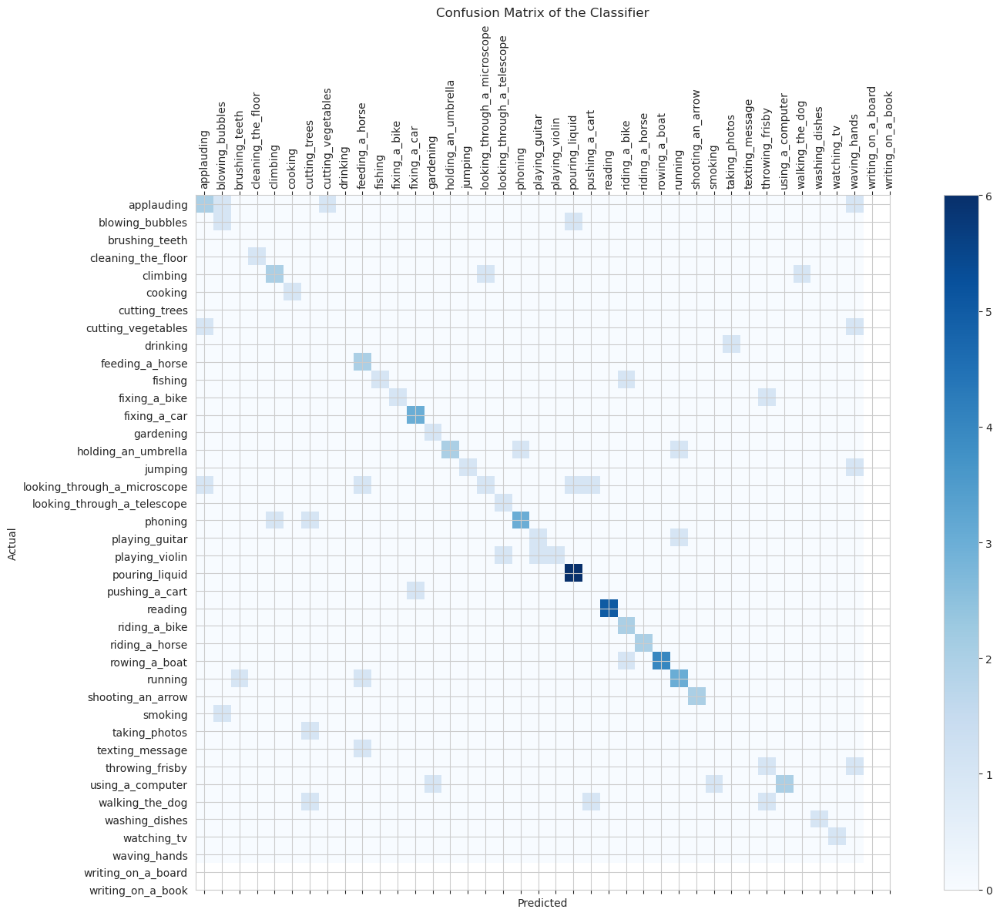

In [44]:
# Generating confusion matrix
labels = columns_class
cm = confusion_matrix(y_true, y_pred_Class_le)
fig, ax = plt.subplots(figsize=(16, 12))
cax = ax.matshow(cm, cmap='Blues')
fig.colorbar(cax)

ax.set_xticks(np.arange(len(labels)))
ax.set_yticks(np.arange(len(labels)))
ax.set_xticklabels(labels, rotation=90)
ax.set_yticklabels(labels)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix of the Classifier')
plt.tight_layout()

plt.savefig(os.path.join(results_path, 'classes_cm_results.png'), bbox_inches='tight')
plt.show()


## Performance for MoreThanOnePerson


For evaluating the MoreThanOnePerson task, we'll start by reviewing the classification report, which provides detailed precision, recall, and F1 scores for the predictions

We'll also visualize the performance with:

1. ROC Curve: Which shows the trade-off between the true positive rate (TPR) and the false positive rate (FPR), helping us assess the model’s performance across different thresholds (set as .4)

2. PR Curve: The precision-recall curve shows the balance between precision and recall, which is especially useful for imbalanced datasets like ours

3. Confusion Matrix: It displays the true positives, true negatives, false positives, and false negatives, offering insight into the classification errors

4. Predicted Probabilities: We’ll plot histograms and density plots of the predicted probabilities to understand their distribution and confidence levels and decide the perfect threshold

In [45]:
# lets get the predictions first
y_pred_persons = pred[1]
y_pred_persons_bool = (y_pred_persons > 0.4) # threshold is set to .4 based on the probabilites results
predictions_persons = y_pred_persons_bool.astype(int)

results_heldout = pd.DataFrame(predictions_persons, columns=person_column)

results_heldout['MoreThanOnePerson'] = le_dic['MoreThanOnePerson'].inverse_transform(results_heldout['MoreThanOnePerson_le'].values)
results_heldout['FileName'] = heldout_generator.filenames
ordered_cols = ['FileName', 'MoreThanOnePerson'] + person_column
results_heldout = results_heldout[ordered_cols]
results_heldout

,FileName,MoreThanOnePerson,MoreThanOnePerson_le
0,Img_5949.jpg,NO,0
1,Img_4778.jpg,YES,1
2,Img_5107.jpg,NO,0
3,Img_1828.jpg,NO,0
4,Img_2785.jpg,NO,0
...,...,...,...
85,Img_692.jpg,YES,1
86,Img_4776.jpg,NO,0
87,Img_3108.jpg,YES,1
88,Img_6019.jpg,NO,0


In [46]:
# classification_report
# ---------------------

column = person_column[0]

y_val = data_balanced[valid_end:][column].values
y_val_pred = results_heldout[column].values
print('Classification Report for MoreThanOnePerson: ')
print(classification_report(y_val, y_val_pred))

Classification Report for MoreThanOnePerson: 
              precision    recall  f1-score   support

           0       0.83      0.95      0.89        58
           1       0.88      0.66      0.75        32

    accuracy                           0.84        90
   macro avg       0.85      0.80      0.82        90
weighted avg       0.85      0.84      0.84        90



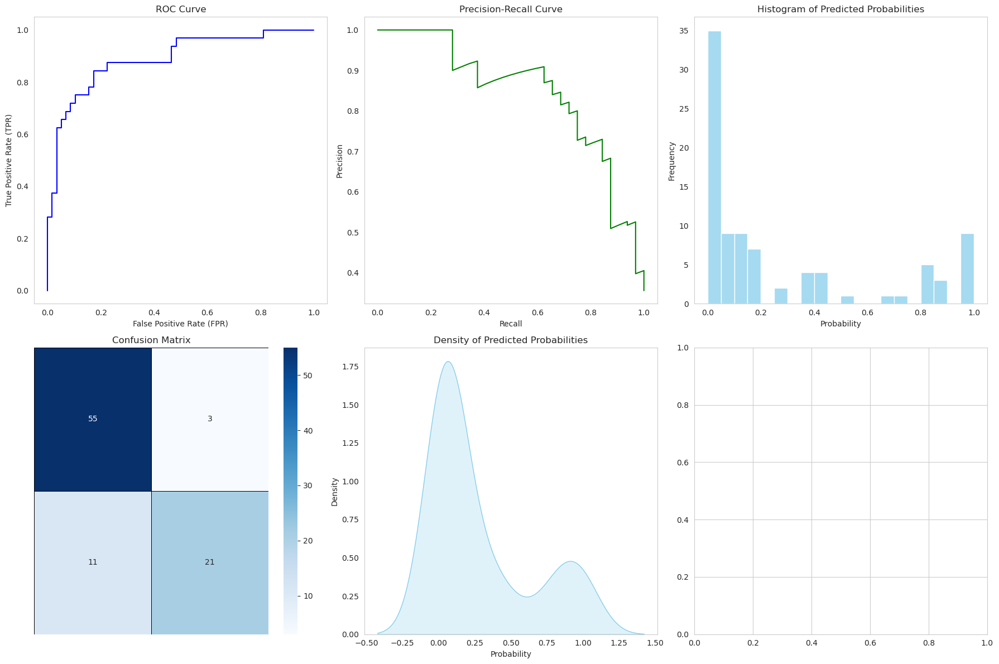

In [47]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# ROC Curve
fpr, tpr, _ = roc_curve(y_val, y_pred_persons[:, 0])
axes[0, 0].plot(fpr, tpr, color='b')
axes[0, 0].set_title('ROC Curve')
axes[0, 0].set_xlabel('False Positive Rate (FPR)')
axes[0, 0].set_ylabel('True Positive Rate (TPR)')
axes[0, 0].grid(False)

# PR Curve
precision, recall, _ = precision_recall_curve(y_val, y_pred_persons[:, 0])
axes[0, 1].plot(recall, precision, color='g')
axes[0, 1].set_title('Precision-Recall Curve')
axes[0, 1].set_xlabel('Recall')
axes[0, 1].set_ylabel('Precision')
axes[0, 1].grid(False)

# Confusion Matrix
cm = confusion_matrix(y_val, predictions_persons[:, 0])
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', linecolor='black', linewidths=.7, ax=axes[1,0 ])
axes[1, 0].set_title('Confusion Matrix')
axes[1, 0].set_xlabel('Predicted')
axes[1, 0].set_ylabel('Actual')
axes[1, 0].axis('off')

# Histogram of Predicted Probabilities
sns.histplot(y_pred_persons[:, 0], kde=False, bins=20, color='skyblue', ax=axes[0, 2])
axes[0, 2].set_title('Histogram of Predicted Probabilities')
axes[0, 2].set_xlabel('Probability')
axes[0, 2].set_ylabel('Frequency')
axes[0, 2].grid(False)

# Density of Predicted Probabilities
sns.kdeplot(y_pred_persons[:, 0], fill=True, color='skyblue', ax=axes[1, 1])
axes[1, 1].set_title('Density of Predicted Probabilities')
axes[1, 1].set_xlabel('Probability')
axes[1, 1].set_ylabel('Density')
axes[1, 1].grid(False)


plt.tight_layout()
plt.savefig(os.path.join(results_path, 'more_than_one_person_results.png'), bbox_inches='tight')
plt.show()


# Final Predictions

Here, we’ll use the future data CSV file to make predictions on the images linked by their FileName. We’ll start by loading the file and recalling the generators, which will rescale the images to values between 0 and 1 and convert their dtype to float64. This matches the way the model was trained, and it’s a must

After the prediction is done, we'll use a dictionary that maps actual Class and MoreThanOnePerson categorical names to their corresponding encoded labels, along with their numbers. This helps us interpret which number corresponds to which class

Finally, we'll plot some of the images along with their predicted classes and the number of people in each image

In [48]:
# Here's a look at the current structure of our project's directory
!tree -L 2 {wd}/

/home/ahmedsalim/projects/Multi-Task-Human-Action-Recognition/
├── README.md
├── conda_list.txt
├── configs
│   └── config.yaml
├── data
│   ├── Images
│   ├── final_predictions.csv
│   ├── future_data_2024.csv
│   └── train_data_2024.csv
├── models
│   ├── best_model.keras
│   ├── model_plot.png
│   └── model_training.log
├── notebook
│   └── notebook.ipynb
├── results
│   ├── classes_cm_results.png
│   ├── final_predictions.csv
│   ├── more_than_one_person_results.png
│   └── training_performance.png
└── src
    └── Modules.py

7 directories, 15 files


In [49]:
# =======================
# FINAL PREDICTION
# =======================

# Model reloading (if needed)
model = load_model(wd + '/models/best_model.keras')

In [50]:
wd = os.path.abspath('../')
pred_data = pd.read_csv(wd + '/data/future_data_2024.csv')
pred_data = pd.read_csv(prediction_data)

pred_data.head()

,FileName,Class,MoreThanOnePerson
0,Img_1963.jpg,NaN,NaN
1,Img_7244.jpg,NaN,NaN
2,Img_6218.jpg,NaN,NaN
3,Img_7703.jpg,NaN,NaN
4,Img_6318.jpg,NaN,NaN


In [51]:
# Recalling the generator
test_datagen=ImageDataGenerator(rescale=1./255., dtype = float_type)

predection_generator=test_datagen.flow_from_dataframe(
    dataframe=pred_data,
    directory=total_images,
    x_col="FileName",
    y_col=None,
    batch_size=1,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(img_height,img_width))

PREDICTION_STEPS = predection_generator.n//predection_generator.batch_size

Found 3128 validated image filenames.


In [52]:
# ==========================
# Serving on predection dataset
# ==========================

predection_generator.reset()
pred=model.predict(
    predection_generator,
    steps=PREDICTION_STEPS,
    verbose=1
)


3128/3128 ━━━━━━━━━━━━━━━━━━━━ 16s 5ms/step


In [53]:
# ==================================
# Performance on predected data
# ==================================

y_pred_Class = pred[0]
y_pred_persons = pred[1]

# Threshold for more than one person
threshold = 0.4
y_pred_persons_bool = (y_pred_persons > threshold)
predictions_persons = y_pred_persons_bool.astype(int)

results = pd.DataFrame(predictions_persons, columns=['MoreThanOnePerson'])

results['PredictedClass'] = np.argmax(y_pred_Class, axis=1)

le = le_dic['Class'] # we earlier encoded the classes defined
results['PredictedClassName'] = le.inverse_transform(results['PredictedClass'].values)

le2 = le_dic['MoreThanOnePerson']
results['PredectedMoreThanOnePerson'] = le2.inverse_transform(results['MoreThanOnePerson'].values)


results['FileName'] = predection_generator.filenames

col = ['FileName', 'PredictedClass', 'PredictedClassName', 'MoreThanOnePerson', 'PredectedMoreThanOnePerson']
results = results[col]
results.head(30)


,FileName,PredictedClass,PredictedClassName,MoreThanOnePerson,PredectedMoreThanOnePerson
0,Img_1963.jpg,8,drinking,0,NO
1,Img_7244.jpg,13,gardening,0,NO
2,Img_6218.jpg,30,taking_photos,1,YES
3,Img_7703.jpg,37,waving_hands,0,NO
4,Img_6318.jpg,38,writing_on_a_board,0,NO
5,Img_919.jpg,19,playing_guitar,0,NO
6,Img_9170.jpg,16,looking_through_a_microscope,0,NO
7,Img_8062.jpg,19,playing_guitar,0,NO
8,Img_7319.jpg,6,cutting_trees,0,NO
9,Img_1819.jpg,12,fixing_a_car,0,NO


In [54]:
# ==================================
# Performance on predected data
# ==================================

y_pred_Class = pred[0]
y_pred_persons = pred[1]

# Threshold for more than one person
threshold = 0.4
y_pred_persons_bool = (y_pred_persons > threshold)
predictions_persons = y_pred_persons_bool.astype(int)

results = pd.DataFrame(predictions_persons, columns=['MoreThanOnePerson'])

results['PredictedClass'] = np.argmax(y_pred_Class, axis=1)

le = le_dic['Class'] # we earlier encoded the classes defined
results['PredictedClassName'] = le.inverse_transform(results['PredictedClass'].values)

le2 = le_dic['MoreThanOnePerson']
results['PredectedMoreThanOnePerson'] = le2.inverse_transform(results['MoreThanOnePerson'].values)


results['FileName'] = predection_generator.filenames

col = ['FileName', 'PredictedClass', 'PredictedClassName', 'MoreThanOnePerson', 'PredectedMoreThanOnePerson']
results = results[col]
results.head(30)


,FileName,PredictedClass,PredictedClassName,MoreThanOnePerson,PredectedMoreThanOnePerson
0,Img_1963.jpg,29,smoking,0,NO
1,Img_7244.jpg,13,gardening,0,NO
2,Img_6218.jpg,30,taking_photos,0,NO
3,Img_7703.jpg,2,brushing_teeth,0,NO
4,Img_6318.jpg,38,writing_on_a_board,0,NO
5,Img_919.jpg,19,playing_guitar,0,NO
6,Img_9170.jpg,16,looking_through_a_microscope,0,NO
7,Img_8062.jpg,10,fishing,0,NO
8,Img_7319.jpg,6,cutting_trees,0,NO
9,Img_1819.jpg,12,fixing_a_car,0,NO


In [55]:
# Reorder columns to match desired format
results = results[['FileName', 'PredictedClassName', 'PredectedMoreThanOnePerson']]
results.rename(columns={'PredictedClassName': 'Class', 'PredectedMoreThanOnePerson': 'MoreThanOnePerson'}, inplace=True)
results.to_csv(os.path.join(results_path, "final_predictions.csv"), index=False)
results

,FileName,Class,MoreThanOnePerson
0,Img_1963.jpg,drinking,NO
1,Img_7244.jpg,gardening,NO
2,Img_6218.jpg,taking_photos,YES
3,Img_7703.jpg,waving_hands,NO
4,Img_6318.jpg,writing_on_a_board,NO
...,...,...,...
3123,Img_7712.jpg,writing_on_a_book,NO
3124,Img_2307.jpg,fixing_a_car,YES
3125,Img_1797.jpg,jumping,NO
3126,Img_7203.jpg,rowing_a_boat,NO


In [56]:
# Reorder columns to match desired format
results = results[['FileName', 'PredictedClassName', 'PredectedMoreThanOnePerson']]
results.rename(columns={'PredictedClassName': 'Class', 'PredectedMoreThanOnePerson': 'MoreThanOnePerson'}, inplace=True)
results.to_csv(os.path.join(results_path, "final_predictions.csv"), index=False)
results

,FileName,Class,MoreThanOnePerson
0,Img_1963.jpg,smoking,NO
1,Img_7244.jpg,gardening,NO
2,Img_6218.jpg,taking_photos,NO
3,Img_7703.jpg,brushing_teeth,NO
4,Img_6318.jpg,writing_on_a_board,NO
...,...,...,...
3123,Img_7712.jpg,writing_on_a_book,NO
3124,Img_2307.jpg,fixing_a_car,YES
3125,Img_1797.jpg,jumping,NO
3126,Img_7203.jpg,rowing_a_boat,NO


Displaying Images: 100%|██████████| 8/8 [00:00<00:00, 145.30it/s]


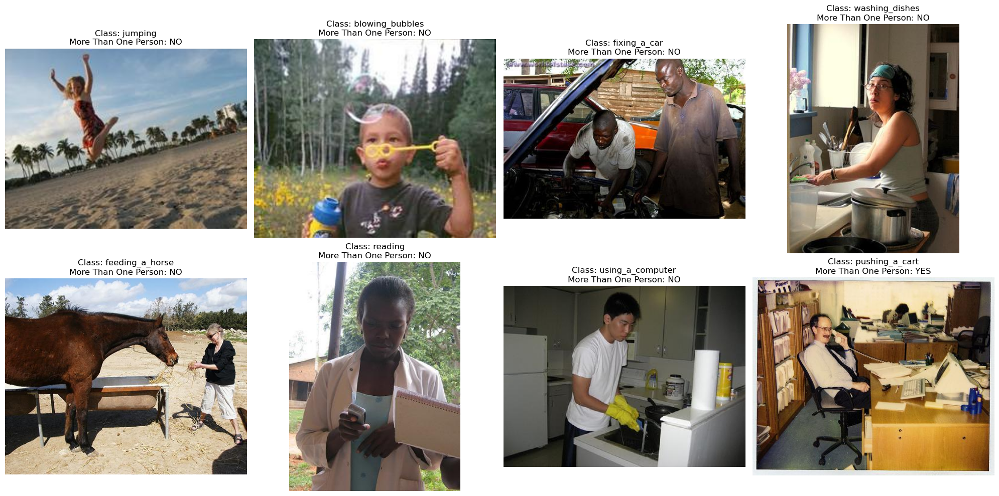

In [57]:
num_imgs = 8  # Number of images to display

random_indices = random.sample(range(len(results)), num_imgs) # Random selection
sample_result = results.iloc[random_indices].reset_index(drop=True)

num_rows = (num_imgs + 4 - 1) // 4
fig, ax = plt.subplots(nrows=num_rows, ncols=4, figsize=(20, 5 * num_rows))
ax = ax.flatten()

for idx, (i, row) in tqdm(enumerate(sample_result.iterrows()), total=num_imgs, desc="Displaying Images"):
    img_path = os.path.join(total_images, row['FileName'])
    class_name = row['Class']
    more_than_one_person = row['MoreThanOnePerson']

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax[idx].imshow(img_rgb)
    ax[idx].set_title(f"Class: {class_name}\nMore Than One Person: {more_than_one_person}")
    ax[idx].axis('off')

plt.tight_layout()
plt.show()
